# Voice Cloning and Fake Audio Detection

### Introduction
A technology company working in the Cyber Security industry wants to build data driven systems that help individuals and organizations to understand whether audio and video media is authentic or fake.


### Data Description:

Two datasets will be used in this project:

[**TIMIT Dataset:**](https://github.com/philipperemy/timit) The TIMIT corpus of read speech is designed to provide speech data for acoustic-phonetic studies and for the development and evaluation of automatic speech recognition systems. TIMIT contains a total of 6300 sentences, 10 sentences spoken by each of 630 speakers from 8 major dialect regions of the United States.

[**CommonVoice Dataset:**](https://commonvoice.mozilla.org/en/datasets) Common Voice is part of Mozilla's initiative to help teach machines how real people speak. Common Voice is a corpus of speech data read by users on the [Common Voice website](https://commonvoice.mozilla.org/), and based upon text from a number of public domain sources like user submitted blog posts, old books, movies, and other public speech corpora. Its primary purpose is to enable the training and testing of automatic speech recognition (ASR) systems.

### Goals(s):
The goal of this project is to build algorithms that can synthesize spoken audio by converting a speaker’s voice to another speaker’s voice with the end goal to detect if any spoken audio is pristine or fake.

### Success Metrics:
* **Voice cloning (VC):** Word Error Rate (WER)
* **Fake audio detection (FAD):** F-score

### Methodology:
**Step 1:** We will build a **Voice Cloning system (VC)** that clones source speaker's voice to the target speaker's voice. We will utlize the TIMIT dataset for this step as it consists of aligned text-audio data with various speakers.

**Step 2:** We will build a **Fake audio detection system (FAD)** that detects if a given audio is synthetically generated or not. We will utilize the CommonVoice dataset as it consists of thousands of naturally spoken audio which could be used as positive examples and creating negative examples using the voice cloning system as automatic data/label generator.

## Part 1: Voice Cloning

As mentioned above, the TIMIT dataset contains 10 recordings from 630 different speakers. All the audio files (4s) are recordings of short sentences from different users. For our Voice cloning system, we will use SV2TTS deep learning framework which is effective in converting text to speech. The framework is made of 3 stages. In the first stage, one creates a digital representation of a voice from a few seconds of audio. In the second and third stages, this representation is used as reference to generate speech given arbitrary text. We will evaluate the performance of the voice cloning system by performing the following experiments. 

We will use the following github repo (https://github.com/CorentinJ/Real-Time-Voice-Cloning.git) for the voice cloning system

**Exp 1:** We will utilize the short recordings from the TIMIT dataset to generate short and long audios and evaluate the perfromance of the model.

**Exp 2:** We will combine the recordings from similar users and use that to generate short and synthetic audios and evaluate the model's perfromance.


### Initial Setup
Import relevant libraries and install the voice cloning model from the github repo

In [1]:
import os
import librosa
import librosa.display
import pandas as pd
import functions
import numpy as np
from IPython.display import display, Audio, clear_output
from moviepy.editor import concatenate_audioclips, AudioFileClip
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split

import tensorflow as tf
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, ConfusionMatrixDisplay

Loaded encoder "encoder.pt" trained to step 1564501
Synthesizer using device: cpu
Building Wave-RNN
Trainable Parameters: 4.481M
Loading model weights at Real-Time-Voice-Cloning\saved_models\default\vocoder.pt


The following cells contain information about the recordings from the TIMIT dataset

In [2]:
train_csv = pd.read_csv("TIMIT_orig/DOC/train_data.csv")
print(train_csv.shape)
train_csv.head()

(31678, 12)


,index,test_or_train,dialect_region,speaker_id,filename,path_from_data_dir,path_from_data_dir_windows,is_converted_audio,is_audio,is_word_file,is_phonetic_file,is_sentence_file
0,1.0,TRAIN,DR4,MMDM0,SI681.WAV.wav,TRAIN/DR4/MMDM0/SI681.WAV.wav,TRAIN\\DR4\\MMDM0\\SI681.WAV.wav,True,True,False,False,False
1,2.0,TRAIN,DR4,MMDM0,SI1311.PHN,TRAIN/DR4/MMDM0/SI1311.PHN,TRAIN\\DR4\\MMDM0\\SI1311.PHN,False,False,False,True,False
2,3.0,TRAIN,DR4,MMDM0,SI1311.WRD,TRAIN/DR4/MMDM0/SI1311.WRD,TRAIN\\DR4\\MMDM0\\SI1311.WRD,False,False,True,False,False
3,4.0,TRAIN,DR4,MMDM0,SX321.PHN,TRAIN/DR4/MMDM0/SX321.PHN,TRAIN\\DR4\\MMDM0\\SX321.PHN,False,False,False,True,False
4,5.0,TRAIN,DR4,MMDM0,SX321.WRD,TRAIN/DR4/MMDM0/SX321.WRD,TRAIN\\DR4\\MMDM0\\SX321.WRD,False,False,True,False,False


In [3]:
test_csv = pd.read_csv("TIMIT_orig/DOC/test_data.csv")
print(test_csv.shape)
test_csv.head()

(31678, 12)


,index,test_or_train,dialect_region,speaker_id,filename,path_from_data_dir,path_from_data_dir_windows,is_converted_audio,is_audio,is_word_file,is_phonetic_file,is_sentence_file
0,1.0,TEST,DR4,MGMM0,SX139.WAV,TEST/DR4/MGMM0/SX139.WAV,TEST\\DR4\\MGMM0\\SX139.WAV,False,True,False,False,False
1,2.0,TEST,DR4,MGMM0,SX139.WAV.wav,TEST/DR4/MGMM0/SX139.WAV.wav,TEST\\DR4\\MGMM0\\SX139.WAV.wav,True,True,False,False,False
2,3.0,TEST,DR4,MGMM0,SX139.TXT,TEST/DR4/MGMM0/SX139.TXT,TEST\\DR4\\MGMM0\\SX139.TXT,False,False,False,False,True
3,4.0,TEST,DR4,MGMM0,SI499.WRD,TEST/DR4/MGMM0/SI499.WRD,TEST\\DR4\\MGMM0\\SI499.WRD,False,False,True,False,False
4,5.0,TEST,DR4,MGMM0,SX319.WRD,TEST/DR4/MGMM0/SX319.WRD,TEST\\DR4\\MGMM0\\SX319.WRD,False,False,True,False,False


The following texts will be used to genrate the synthetic audio files

In [4]:
long_text = """Two roads diverged in a yellow wood,
And sorry I could not travel both 
And be one traveler, long I stood
And looked down one as far as I could
To where it bent in the undergrowth;""".replace('\n',' ')

short_text = "If you're looking for random paragraphs, you've come to the right place"

We will display random samples from the TIMIT dataset

In [5]:
audio_1, sample_rate = librosa.load('TIMIT_orig/TRAIN/DR4/FLHD0/SA1.WAV')
display(Audio(audio_1, autoplay=True, rate=sample_rate))

In [57]:
audio_2, sample_rate = librosa.load('TIMIT_orig/TRAIN/DR1/MCPM0/SA2.WAV')
display(Audio(audio_2, autoplay=True, rate=sample_rate))

#### Exp - 1.1: 
In the following section, we will use the short recordings from the TIMIT dataset to generate the synthetic audios for short texts.

In [8]:
functions.synthesize_audio(audio_1, short_text, 'cloned_data/exp-1-1.wav')
functions.synthesize_audio(audio_2, short_text, 'cloned_data/exp-1-2.wav')
functions.synthesize_audio(audio_3, short_text, 'cloned_data/exp-1-3.wav')

In [9]:
display(Audio('cloned_data/exp-1-1.wav', autoplay=True))

In [58]:
display(Audio('cloned_data/exp-1-2.wav', autoplay=True))

In [14]:
sim_score11, wer11 = functions.text_comparison('cloned_data/exp-1-1.wav', short_text)
sim_score12, wer12 = functions.text_comparison('cloned_data/exp-1-2.wav', short_text)
sim_score13, wer13 = functions.text_comparison('cloned_data/exp-1-3.wav', short_text)

print("WER for the cloned audio: ", (wer11, wer12, wer13))
print("Mean WER: ", np.mean([wer11, wer12, wer13])*100)
print("Similarity scores for the cloned audio: ", (sim_score11, sim_score12, sim_score13))

result2:
{   'alternative': [   {   'confidence': 0.92887503,
                           'transcript': "if you're looking for random "
                                         "paragraphs you've come to the right "
                                         'place'},
                       {   'transcript': "if you're looking for random "
                                         'paragraphs you come to the right '
                                         'place'},
                       {   'transcript': "if you're looking for random "
                                         "paragraph you've come to the right "
                                         'place'},
                       {   'transcript': "if you're looking for the program "
                                         "you've come to the right place"},
                       {   'transcript': "if you're looking from the programme "
                                         "you've come to the right place"}],
    'final': True}

#### Exp - 1.2: 
In the following section, we will use the short recordings from the TIMIT dataset to generate the synthetic audios for long texts.

In [15]:
functions.synthesize_audio(audio_1, long_text, 'cloned_data/exp-2-1.wav')
functions.synthesize_audio(audio_2, long_text, 'cloned_data/exp-2-2.wav')
functions.synthesize_audio(audio_3, long_text, 'cloned_data/exp-2-3.wav')

In [16]:
display(Audio('cloned_data/exp-2-1.wav', autoplay=True))

In [60]:
display(Audio('cloned_data/exp-2-3.wav', autoplay=True))

In [20]:
sim_score21, wer21 = functions.text_comparison('cloned_data/exp-2-1.wav', long_text)
sim_score22, wer22 = functions.text_comparison('cloned_data/exp-2-2.wav', long_text)
sim_score23, wer23 = functions.text_comparison('cloned_data/exp-2-3.wav', long_text)

print("WER for the cloned audio: ", (wer21, wer22, wer23))
print("Mean WER: ", np.mean([wer21, wer22, wer23])*100)
print("Similarity scores for the cloned audio: ", (sim_score21, sim_score22, sim_score23))

result2:
{   'alternative': [   {   'confidence': 0.94701397,
                           'transcript': 'two roads diverged in a yellow wood '
                                         'and sorry I could not travel both in '
                                         'B1 traveler long I stood in the one '
                                         'as far as I could do words that end '
                                         'in the underground'},
                       {   'transcript': 'two roads diverged in a yellow wood '
                                         'and sorry I could not travel both in '
                                         'B1 traveler long I stood the one as '
                                         'far as I could do words that end in '
                                         'the underground'},
                       {   'transcript': 'two roads diverged in a yellow wood '
                                         'and sorry I could not travel both in '
          

Results from exp 1-2 are much worse than the results from exp 1-1 with 58% Word Error Rate. This is because, it is difficult to generate long audio files from short sample and the rest of the words could not be synthesised

For the next part of the experiments, we will combine recoedings from the same speakers in the TIMIT dataset into a single file (30s). There are 6300 recordings from 630 speakers. We will generate 630 audio files by combining these recordings from the same speakers.

In [23]:
ORIGINAL_FILES_PATH = 'TIMIT_orig\TRAIN'

my_dict = {}
for root, dirs, files in os.walk(ORIGINAL_FILES_PATH, topdown=False):
    for file in files:
        _, file_extension = os.path.splitext(file)
        if file_extension == '.WAV':
            file_path = os.path.join(root, file)
            if file_path.split('\\')[3] not in my_dict:
                my_dict[file_path.split('\\')[3]] = [file_path]
            else:
                my_dict[file_path.split('\\')[3]].append(file_path)


ORIGINAL_FILES_PATH1 = 'TIMIT_orig\TEST'

for root, dirs, files in os.walk(ORIGINAL_FILES_PATH1, topdown=False):
    for file in files:
        _, file_extension = os.path.splitext(file)
        if file_extension == '.WAV':
            file_path = os.path.join(root, file)
            if file_path.split('\\')[3] not in my_dict:
                my_dict[file_path.split('\\')[3]] = [file_path]
            else:
                my_dict[file_path.split('\\')[3]].append(file_path)

                
# This dictionary saves paths of all the recordings from the same speaker under a single key
print(len(my_dict))
print(list(my_dict.items())[0])

630
('FCJF0', ['TIMIT_orig\\TRAIN\\DR1\\FCJF0\\SA1.WAV', 'TIMIT_orig\\TRAIN\\DR1\\FCJF0\\SA2.WAV', 'TIMIT_orig\\TRAIN\\DR1\\FCJF0\\SI1027.WAV', 'TIMIT_orig\\TRAIN\\DR1\\FCJF0\\SI1657.WAV', 'TIMIT_orig\\TRAIN\\DR1\\FCJF0\\SI648.WAV', 'TIMIT_orig\\TRAIN\\DR1\\FCJF0\\SX127.WAV', 'TIMIT_orig\\TRAIN\\DR1\\FCJF0\\SX217.WAV', 'TIMIT_orig\\TRAIN\\DR1\\FCJF0\\SX307.WAV', 'TIMIT_orig\\TRAIN\\DR1\\FCJF0\\SX37.WAV', 'TIMIT_orig\\TRAIN\\DR1\\FCJF0\\SX397.WAV'])


Concatenate the audio files from the same speakers into a single file 

In [24]:
functions.concat_audio(my_dict['MWDK0'], 'cloned_data/long-audio-1.wav')
functions.concat_audio(my_dict['FGRW0'], 'cloned_data/long-audio-2.wav')
functions.concat_audio(my_dict['MSAT1'], 'cloned_data/long-audio-3.wav')

MoviePy - Writing audio in cloned_data/long-audio-1.wav


MoviePy - Done.
MoviePy - Writing audio in cloned_data/long-audio-2.wav


MoviePy - Done.
MoviePy - Writing audio in cloned_data/long-audio-3.wav


MoviePy - Done.


In [25]:
display(Audio('cloned_data/long-audio-1.wav', autoplay=True))

#### Exp - 2.1: 
In the following section, we will use the long recordings from the TIMIT dataset to generate the synthetic audios for short texts.

In [28]:
functions.synthesize_audio('cloned_data/long-audio-1.wav', short_text, 'cloned_data/exp-3-1.wav')
functions.synthesize_audio('cloned_data/long-audio-2.wav', short_text, 'cloned_data/exp-3-2.wav')
functions.synthesize_audio('cloned_data/long-audio-3.wav', short_text, 'cloned_data/exp-3-3.wav')

In [30]:
display(Audio('cloned_data/exp-3-1.wav', autoplay=True))

In [61]:
display(Audio('cloned_data/exp-3-2.wav', autoplay=True))

In [28]:
sim_score31, wer31 = functions.text_comparison('cloned_data/exp-3-1.wav', short_text)
sim_score32, wer32 = functions.text_comparison('cloned_data/exp-3-2.wav', short_text)
sim_score33, wer33 = functions.text_comparison('cloned_data/exp-3-3.wav', short_text)

print("WER for the cloned audio: ", (wer31, wer32, wer33))
print("Mean WER: ", np.mean([wer31, wer32, wer33])*100)
print("Similarity scores for the cloned audio: ", (sim_score31, sim_score32, sim_score33))

result2:
{   'alternative': [   {   'confidence': 0.93214679,
                           'transcript': "if you're looking for random "
                                         "paragraphs you've come to the right "
                                         'place'},
                       {   'transcript': "if you're looking for random "
                                         "paragraph you've come to the right "
                                         'place'},
                       {   'transcript': "if you're looking for random "
                                         'paragraphs you come to the right '
                                         'place'}],
    'final': True}
cloned_text:  if you're looking for random paragraphs you've come to the right place
original_text:  If you're looking for random paragraphs, you've come to the right place
####################################################################
result2:
{   'alternative': [   {   'confidence': 0.93057448,
      

#### Exp - 2.2: 
In the following section, we will use the long recordings from the TIMIT dataset to generate the synthetic audios for long texts.

In [34]:
functions.synthesize_audio('cloned_data/long-audio-1.wav', long_text, 'cloned_data/exp-4-1.wav')
functions.synthesize_audio('cloned_data/long-audio-2.wav', long_text, 'cloned_data/exp-4-2.wav')
functions.synthesize_audio('cloned_data/long-audio-3.wav', long_text, 'cloned_data/exp-4-3.wav')

In [36]:
display(Audio('cloned_data/exp-4-1.wav', autoplay=True))

In [62]:
display(Audio('cloned_data/exp-4-2.wav', autoplay=True))

In [32]:
sim_score41, wer41 = functions.text_comparison('cloned_data/exp-4-1.wav', long_text)
sim_score42, wer42 = functions.text_comparison('cloned_data/exp-4-2.wav', long_text)
sim_score43, wer43 = functions.text_comparison('cloned_data/exp-4-3.wav', long_text)

print("WER for the cloned audio: ", (wer41, wer42, wer43))
print("Mean WER: ", np.mean([wer41, wer42, wer43])*100)
print("Similarity scores for the cloned audio: ", (sim_score41, sim_score42, sim_score43))

result2:
{   'alternative': [   {   'confidence': 0.92204505,
                           'transcript': 'two roads diverged in a yellow wood '
                                         'and sorry I could not travel both '
                                         'and the one traveler long I stood '
                                         'and looked down one in that far '
                                         "that's about it"},
                       {   'transcript': 'two roads diverged in a yellow wood '
                                         'and sorry I could not travel both '
                                         'and in one traveler long I stood and '
                                         "looked down one in that far that's "
                                         'about it'},
                       {   'transcript': 'two roads diverged in a yellow wood '
                                         'and sorry I could not travel both '
                                   

The results from exp 2-2 and exp 1-2 indicate the model is not efficient in generating long audio files. It is better to generate sythetic audio files for short texts.

For our project, we will generate short synthetic audio files and use them in our classification model.

In the first step, we will combine all the recordings from the same speakers into a single file.

In [ ]:
# Combine all the recordings from same speakers into a single file

for key, value in my_dict.items():
    files = my_dict[key]
    clips = [AudioFileClip(clip) for clip in files]
    final_clip = concatenate_audioclips(clips)
    final_clip.write_audiofile(f"data/long_version_audio/{key}.wav")

text_list is a list of samples short texts used in the TIMIT dataset

In [33]:
text_list = []

text_file = open('TIMIT_orig/DOC/PROMPTS.TXT', 'r')
for line in text_file:
    a = line.replace('\n', '').replace('.', '').replace('?', '').replace('!', '')
    if len(a.split()) >= 11:
        text_list.append(a)

We will generate synthetic audio files

In [ ]:
file_count = 1

for index, file in enumerate(os.listdir("data/long_version_audio")):
    text = text_list[index]
    src = os.path.join("data/long_version_audio", file)
    dst = os.path.join("data/synthetic_audio", file)
    functions.synthesize_audio(src, text, dst)
    print(f"{file_count} files have been cloned.")
    file_count+=1

630 files have been cloned.

Sample synthetic file

In [39]:
display(Audio('data/synthetic_audio/MDSJ0.wav', autoplay=True))

"\nX = librosa.stft(data_example)\nXdb = librosa.amplitude_to_db(abs(X))\nplt.figure(figsize=(14, 5))\nlibrosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='hz') \n#If to pring log of frequencies  \n#librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')\nplt.colorbar()\n\nprint(mfcc.shape)#Displaying  the MFCCs:\nlibrosa.display.specshow(mfcc, sr=sampling_rate, x_axis='time')\n\n"

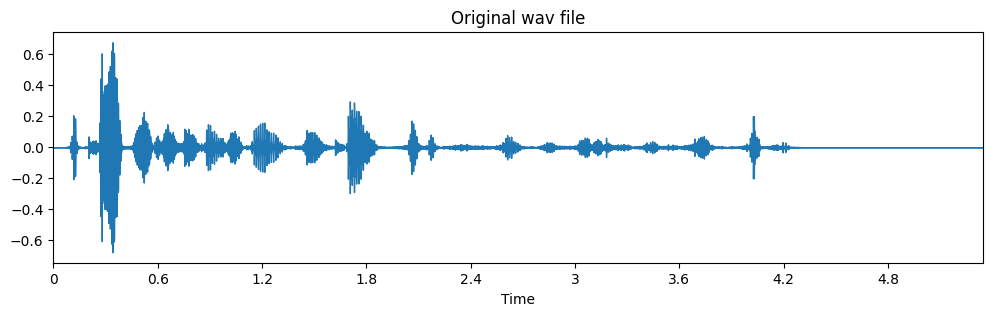

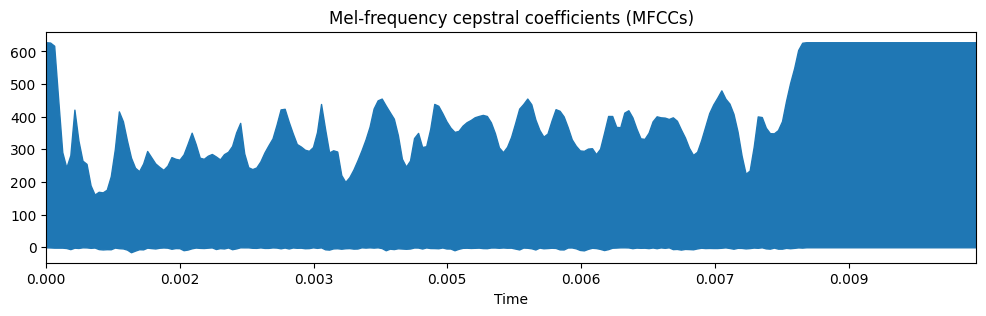

In [42]:
data_example, sampling_rate = librosa.load('data/synthetic_audio/MDSJ0.wav')

fig1 = plt.figure(figsize=(12, 3))
fig1 = librosa.display.waveplot(data_example, sr=sampling_rate)
fig1 = plt.title('Original wav file')

fig2 = plt.figure(figsize=(12, 3))
mfcc = librosa.feature.mfcc(data_example, sr=sampling_rate, n_mfcc=40)
mfcc1 = librosa.feature.mfcc(data_example)
fig2 = librosa.display.waveplot(mfcc)
fig2 = plt.title('Mel-frequency cepstral coefficients (MFCCs)');


"""
X = librosa.stft(data_example)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='hz') 
#If to pring log of frequencies  
#librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

print(mfcc.shape)#Displaying  the MFCCs:
librosa.display.specshow(mfcc, sr=sampling_rate, x_axis='time')

"""

## Part 2: Fake Audio Detection
In this step, we will build a neural network based classifier to separate synthetic audio files from real ones. We will extract features such as mel spectogram, fourier transforms etc from audio files and train the neural network to build a classification model

#### Dataset preparation

In [43]:
synthetic_file_list = os.listdir('data/synthetic_audio/')
synthetic_df = pd.DataFrame([f"data/synthetic_audio/{i}" for i in synthetic_file_list], columns=['files'])
synthetic_df['y'] = 0
print(synthetic_df)


real_file_list = os.listdir('data/real_audio/')
real_df = pd.DataFrame([f"data/real_audio/{i}" for i in real_file_list], columns=['files'])
real_df['y'] = 1
print(real_df)

df = pd.concat([synthetic_df, real_df], axis=0, ignore_index=True)
print(df.shape)
df.head()

                              files  y
0    data/synthetic_audio/FADG0.wav  0
1    data/synthetic_audio/FAEM0.wav  0
2    data/synthetic_audio/FAJW0.wav  0
3    data/synthetic_audio/FAKS0.wav  0
4    data/synthetic_audio/FALK0.wav  0
..                              ... ..
625  data/synthetic_audio/MWRP0.wav  0
626  data/synthetic_audio/MWSB0.wav  0
627  data/synthetic_audio/MWSH0.wav  0
628  data/synthetic_audio/MWVW0.wav  0
629  data/synthetic_audio/MZMB0.wav  0

[630 rows x 2 columns]
                                            files  y
0    data/real_audio/common_voice_en_37285576.mp3  1
1    data/real_audio/common_voice_en_37285577.mp3  1
2    data/real_audio/common_voice_en_37285578.mp3  1
3    data/real_audio/common_voice_en_37285724.mp3  1
4    data/real_audio/common_voice_en_37285725.mp3  1
..                                            ... ..
665  data/real_audio/common_voice_en_38016050.mp3  1
666  data/real_audio/common_voice_en_38016051.mp3  1
667  data/real_audio/common_voi

,files,y
0,data/synthetic_audio/FADG0.wav,0
1,data/synthetic_audio/FAEM0.wav,0
2,data/synthetic_audio/FAJW0.wav,0
3,data/synthetic_audio/FAKS0.wav,0
4,data/synthetic_audio/FALK0.wav,0


Our dataset consists of 1300 recordings from both cloned audio files and real audio files. We will train the model with 1053 audio files and use the rest for validation and testing.

In [45]:
X = df[['files']]
y = df[['y']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, shuffle=True, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42, shuffle=True, stratify=y_train)

print(f"X_train length is: {len(X_train)}, y_train length is: {len(y_train)}")
print("Training data distribution\n", y_train.value_counts())

print(f"X_test length is: {len(X_test)}, y_test length is: {len(y_test)}")
print("Test data distribution\n", y_test.value_counts())

print(f"X_val length is: {len(X_val)}, y_val length is: {len(y_val)}")
print("Test data distribution\n", y_val.value_counts())

X_train length is: 1053, y_train length is: 1053
Training data distribution
 y
1    543
0    510
dtype: int64
X_test length is: 130, y_test length is: 130
Test data distribution
 y
1    67
0    63
dtype: int64
X_val length is: 117, y_val length is: 117
Test data distribution
 y
1    60
0    57
dtype: int64


In [46]:
train_features = functions.extract_features(X_train.files)
val_features = functions.extract_features(X_val.files)
test_features = functions.extract_features(X_test.files)

In [47]:
X_train_data = functions.concat_features(train_features)
X_val_data = functions.concat_features(val_features)
X_test_data = functions.concat_features(test_features)

In [48]:
y_train = np.array(y_train)
y_val = np.array(y_val)
y_test = np.array(y_test)

In [50]:
print("Shape of the training data: ", X_train_data.shape)
print("Shape of the testing data: ", X_test_data.shape)

Shape of the training data:  (1053, 193)
Shape of the testing data:  (130, 193)


#### Create a custom classifier
Train the neural network with the training dataset and validate it using test dataset.

In [51]:
classifier_model = tf.keras.Sequential([
    tf.keras.layers.Dense(50, activation='relu', input_shape=(193,)),
    tf.keras.layers.Dense(50, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')])


classifier_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), 
                         loss = 'binary_crossentropy',
                         metrics=["accuracy"])

In [52]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, verbose=1)

classifier_model_history = classifier_model.fit(X_train_data, y_train,
                                                epochs=1000,
                                                validation_data=(X_val_data, y_val),
                                                callbacks=[callback])

Epoch 1/1000
33/33 [==============================] - 7s 20ms/step - loss: 0.3510 - accuracy: 0.8794 - val_loss: 0.1706 - val_accuracy: 0.9573
Epoch 2/1000
33/33 [==============================] - 0s 2ms/step - loss: 0.0928 - accuracy: 0.9782 - val_loss: 0.0773 - val_accuracy: 0.9658
Epoch 3/1000
33/33 [==============================] - 0s 7ms/step - loss: 0.0549 - accuracy: 0.9867 - val_loss: 0.0620 - val_accuracy: 0.9744
Epoch 4/1000
33/33 [==============================] - 0s 3ms/step - loss: 0.0407 - accuracy: 0.9924 - val_loss: 0.0541 - val_accuracy: 0.9744
Epoch 5/1000
33/33 [==============================] - 0s 2ms/step - loss: 0.0322 - accuracy: 0.9915 - val_loss: 0.0476 - val_accuracy: 0.9744
Epoch 6/1000
33/33 [==============================] - 0s 2ms/step - loss: 0.0225 - accuracy: 0.9953 - val_loss: 0.0401 - val_accuracy: 0.9829
Epoch 7/1000
33/33 [==============================] - 0s 3ms/step - loss: 0.0180 - accuracy: 0.9972 - val_loss: 0.0326 - val_accuracy: 0.9744
Epoch

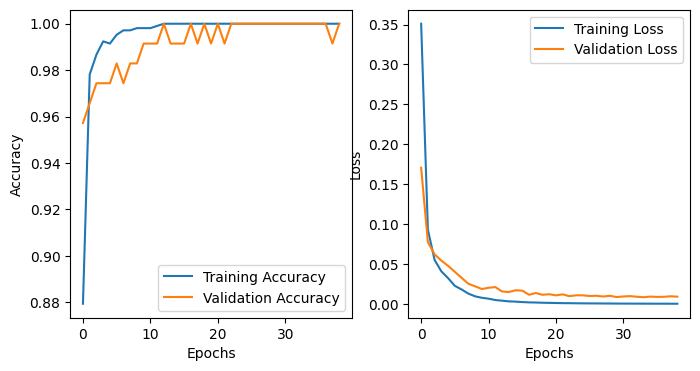

In [55]:
functions.plot_curves(classifier_model_history, epochs=39)

Evaluate the model on test data

5/5 [==============================] - 0s 16ms/step
Accuracy of the model on test data :  0.9923076923076923
####################################################################################################
              precision    recall  f1-score   support

           0       1.00      0.98      0.99        63
           1       0.99      1.00      0.99        67

    accuracy                           0.99       130
   macro avg       0.99      0.99      0.99       130
weighted avg       0.99      0.99      0.99       130



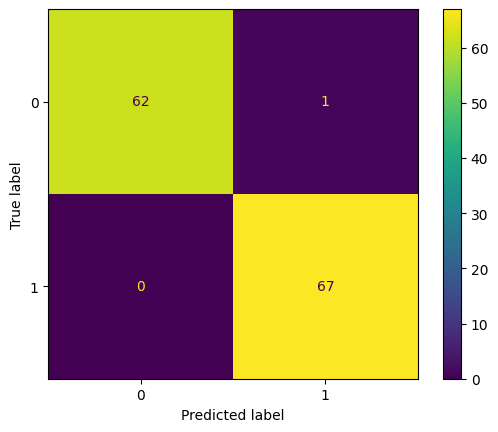

Total Synthetic recordings predicted 62
Total real recordings predicted 68


In [56]:
y_pred = classifier_model.predict(X_test_data)
y_pred = np.rint(y_pred)
y_pred = y_pred.flatten()

functions.eval_results(y_test, y_pred)

The classifier performs exceptionally well in classifying real audio from synthetic audio files.

In this section we will evaluate the performance of the classifier on publically available synthetic datasets.

The synthetic dataset is downloaded from the blizzard challenge website(https://www.cstr.ed.ac.uk/projects/blizzard/data.html). I have copied around 3000 synthetic audio files from the blizzard dataset and combined with 3000 real audio files from the common voice dataset to form the dataset for this experiment.

In [8]:
# The dataset from the blizzard challenge have been copied to orig_data/fake folder

synthetic_file_list = os.listdir('dataset/synthetic_audio/')
synthetic_df = pd.DataFrame([f"dataset/synthetic_audio/{i}" for i in synthetic_file_list], columns=['files'])
synthetic_df['y'] = 0
print(synthetic_df)


real_file_list = os.listdir('dataset/real_audio/')
real_df = pd.DataFrame([f"dataset/real_audio/{i}" for i in real_file_list], columns=['files'])
real_df['y'] = 1
print(real_df)

df = pd.concat([synthetic_df, real_df], axis=0, ignore_index=True)
print(df.shape)
df.head()

                                                  files  y
0     dataset/synthetic_audio/fake_TRAIN_DR1_FCJF0_S...  0
1     dataset/synthetic_audio/fake_TRAIN_DR1_FCJF0_S...  0
2     dataset/synthetic_audio/fake_TRAIN_DR1_FCJF0_S...  0
3     dataset/synthetic_audio/fake_TRAIN_DR1_FCJF0_S...  0
4     dataset/synthetic_audio/fake_TRAIN_DR1_FCJF0_S...  0
...                                                 ... ..
3005  dataset/synthetic_audio/fake_TRAIN_DR5_MJRG0_S...  0
3006  dataset/synthetic_audio/fake_TRAIN_DR5_MJRG0_S...  0
3007  dataset/synthetic_audio/fake_TRAIN_DR5_MJRG0_S...  0
3008  dataset/synthetic_audio/fake_TRAIN_DR5_MJRG0_S...  0
3009  dataset/synthetic_audio/fake_TRAIN_DR5_MJRG0_S...  0

[3010 rows x 2 columns]
                                                files  y
0     dataset/real_audio/common_voice_en_37285756.mp3  1
1     dataset/real_audio/common_voice_en_37285757.mp3  1
2     dataset/real_audio/common_voice_en_37285758.mp3  1
3     dataset/real_audio/common_voice_e

,files,y
0,dataset/synthetic_audio/fake_TRAIN_DR1_FCJF0_S...,0
1,dataset/synthetic_audio/fake_TRAIN_DR1_FCJF0_S...,0
2,dataset/synthetic_audio/fake_TRAIN_DR1_FCJF0_S...,0
3,dataset/synthetic_audio/fake_TRAIN_DR1_FCJF0_S...,0
4,dataset/synthetic_audio/fake_TRAIN_DR1_FCJF0_S...,0


Our dataset consists of 6085 recordings from both cloned audio files and real audio files. We will train the model with 4396 audio files and use the rest for validation and testing.

In [9]:
X = df[['files']]
y = df[['y']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42, shuffle=True, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.15, random_state=42, shuffle=True, stratify=y_train)

print(f"X_train length is: {len(X_train)}, y_train length is: {len(y_train)}")
print("Training data distribution\n", y_train.value_counts())

print(f"X_test length is: {len(X_test)}, y_test length is: {len(y_test)}")
print("Test data distribution\n", y_test.value_counts())

print(f"X_val length is: {len(X_val)}, y_val length is: {len(y_val)}")
print("Test data distribution\n", y_val.value_counts())

X_train length is: 4396, y_train length is: 4396
Training data distribution
 y
1    2222
0    2174
dtype: int64
X_test length is: 913, y_test length is: 913
Test data distribution
 y
1    461
0    452
dtype: int64
X_val length is: 776, y_val length is: 776
Test data distribution
 y
1    392
0    384
dtype: int64


In [10]:
train_features = functions.extract_features(X_train.files)
val_features = functions.extract_features(X_val.files)
test_features = functions.extract_features(X_test.files)

In [11]:
X_train_data = functions.concat_features(train_features)
X_val_data = functions.concat_features(val_features)
X_test_data = functions.concat_features(test_features)

In [12]:
y_train = np.array(y_train)
y_val = np.array(y_val)
y_test = np.array(y_test)

In [13]:
print("Shape of the training data: ", X_train_data.shape)
print("Shape of the testing data: ", X_test_data.shape)

Shape of the training data:  (4396, 193)
Shape of the testing data:  (913, 193)


In [14]:
classifier_model = tf.keras.Sequential([
    tf.keras.layers.Dense(50, activation='relu', input_shape=(193,)),
    tf.keras.layers.Dense(50, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')])


classifier_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), 
                         loss = 'binary_crossentropy',
                         metrics=["accuracy"])

callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, verbose=1)

classifier_model_history = classifier_model.fit(X_train_data, y_train,
                                                epochs=1000,
                                                validation_data=(X_val_data, y_val),
                                                callbacks=[callback])

Epoch 1/1000
138/138 [==============================] - 19s 14ms/step - loss: 0.1778 - accuracy: 0.9249 - val_loss: 0.0568 - val_accuracy: 0.9910
Epoch 2/1000
138/138 [==============================] - 0s 3ms/step - loss: 0.0249 - accuracy: 0.9952 - val_loss: 0.0307 - val_accuracy: 0.9936
Epoch 3/1000
138/138 [==============================] - 0s 2ms/step - loss: 0.0099 - accuracy: 0.9982 - val_loss: 0.0181 - val_accuracy: 0.9936
Epoch 4/1000
138/138 [==============================] - 0s 2ms/step - loss: 0.0048 - accuracy: 0.9993 - val_loss: 0.0152 - val_accuracy: 0.9961
Epoch 5/1000
138/138 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 0.0100 - val_accuracy: 0.9961
Epoch 6/1000
138/138 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 0.0107 - val_accuracy: 0.9974
Epoch 7/1000
138/138 [==============================] - 0s 2ms/step - loss: 8.1973e-04 - accuracy: 1.0000 - val_loss: 0.0099 - val_acc

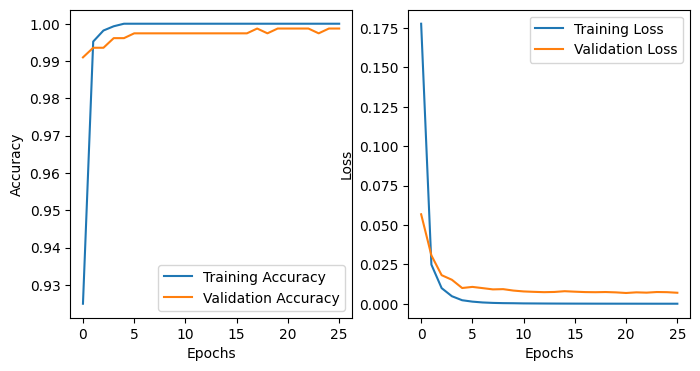

In [15]:
functions.plot_curves(classifier_model_history, epochs=26)

29/29 [==============================] - 0s 3ms/step
Accuracy of the model on test data :  0.9956188389923329
####################################################################################################
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       452
           1       1.00      0.99      1.00       461

    accuracy                           1.00       913
   macro avg       1.00      1.00      1.00       913
weighted avg       1.00      1.00      1.00       913



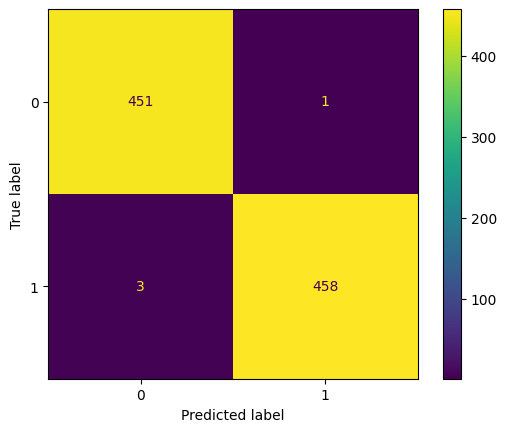

Total Synthetic recordings predicted 454
Total real recordings predicted 459


In [16]:
y_pred = classifier_model.predict(X_test_data)
y_pred = np.rint(y_pred)
y_pred = y_pred.flatten()

functions.eval_results(y_test, y_pred)

The classifier perfroms well on the blizzard dataset as well